# DBSCAN

DBSCAN (Density-Based Spatial Clustering of Applications with Noise) groups points by areas of 
high sample density and marks isolated points as noise. 
It does not require the number of clusters and can discover arbitrarily shaped clusters.

### Key concepts
- $\epsilon$-neighborhood: all points within radius $\epsilon$ of a point.
- `min_samples`: minimum number of points (including the point itself) required to consider a point "core".
- Core, border, noise points:
  - Core: at least `min_samples` points in its $\epsilon$-neighborhood
  - Border: not core, but within $\epsilon$ of a core point
  - Noise: neither core nor border
- Clusters form by connecting core points that are density-reachable; border points attach to nearby core clusters.

### Algorithm (high-level)
1. For each unvisited point, check if it is a core point.
2. If core: start a new cluster and grow it by iteratively adding points in $\epsilon$-neighborhoods (density-reachability).
3. If not core: label as noise (may later become border if reached by a cluster).


### Practical parameters
- $\epsilon$: neighborhood radius.
- `min_samples`: density threshold; typical 2D demos use 4–10, increased in higher dimensions.


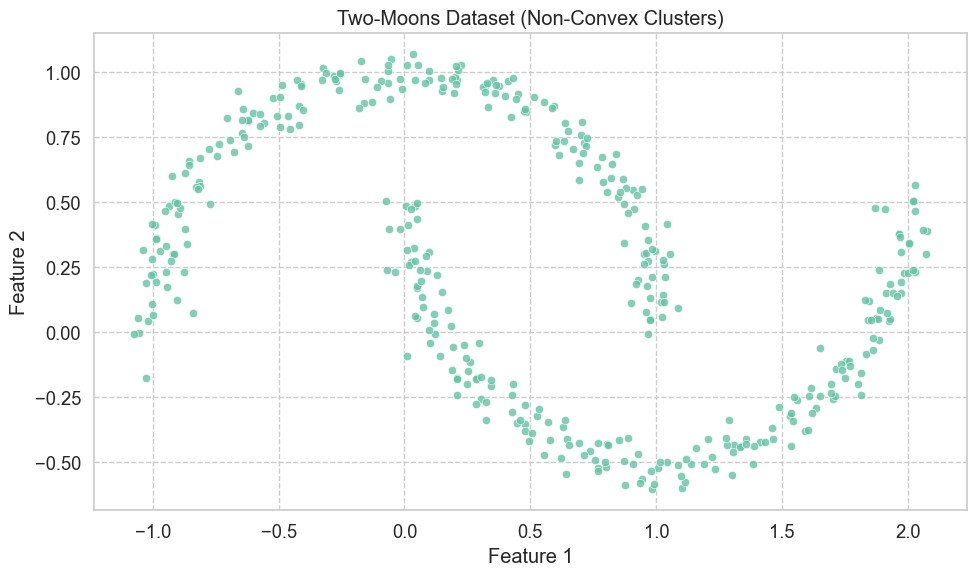

In [ ]:

# Imports and style
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.datasets import make_moons
from sklearn.cluster import DBSCAN, KMeans
from sklearn.neighbors import NearestNeighbors

# Plotting style (consistent with other notebooks)
sns.set(font_scale=1.2)
sns.set_style("whitegrid", {"grid.linestyle": "--"})
sns.set_palette("Set2")
plt.rcParams["figure.figsize"] = (10, 6)

# Reproducibility
RNG = 42

# Generate two-moons
X, _ = make_moons(n_samples=400, noise=0.05, random_state=RNG)

# Quick look at the raw data
X_np = np.asarray(X)
plt.figure()
sns.scatterplot(x=X_np[:, 0], y=X_np[:, 1], alpha=0.8)
plt.title("Two-Moons Dataset (Non-Convex Clusters)")
plt.xlabel("Feature 1")
plt.ylabel("Feature 2")
plt.tight_layout()
plt.show()



## K-Means vs DBSCAN

- **K-Means**: prefers roughly spherical clusters, requires choosing `k`, sensitive to outliers.
- **DBSCAN**: finds arbitrarily shaped clusters, **flags outliers automatically**, requires `eps` and `min_samples`.


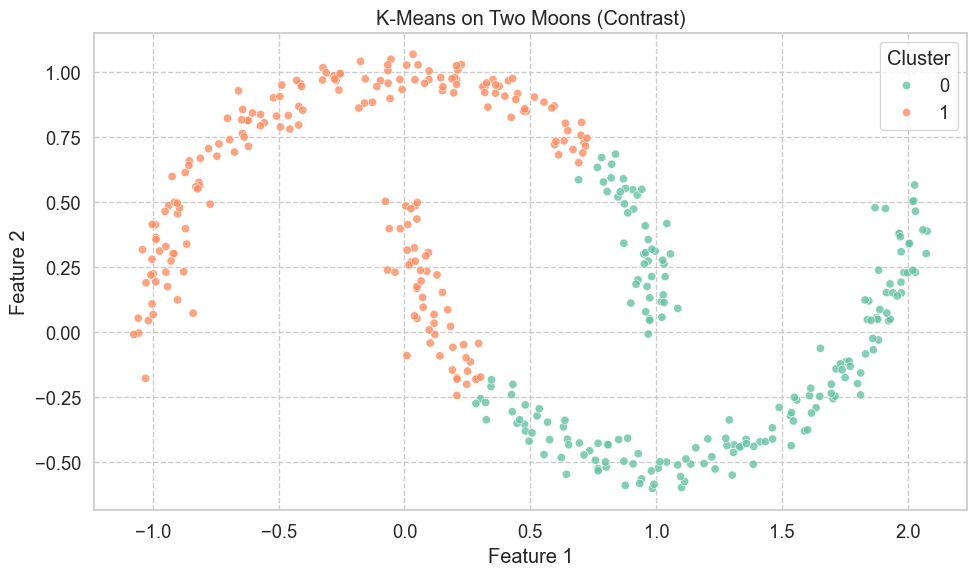

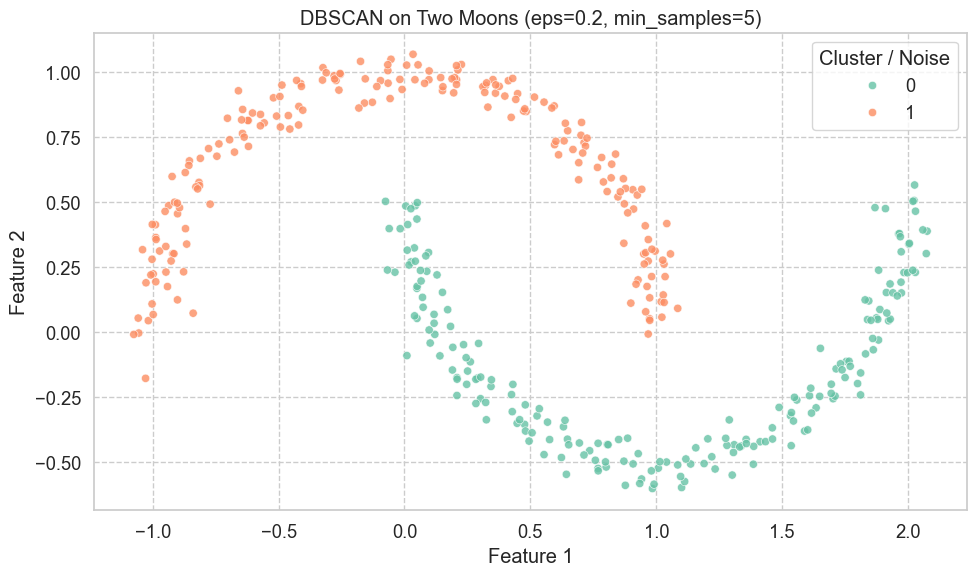

In [7]:
# K-Means for comparison (k=2)
kmeans = KMeans(n_clusters=2, n_init="auto", random_state=RNG)
km_labels = kmeans.fit_predict(X_np)

plt.figure()
sns.scatterplot(x=X_np[:, 0], y=X_np[:, 1], hue=km_labels, alpha=0.8)
plt.title("K-Means on Two Moons (Contrast)")
plt.xlabel("Feature 1")
plt.ylabel("Feature 2")
plt.legend(title="Cluster", loc="best")
plt.tight_layout()
plt.show()

# A basic DBSCAN run (parameters chosen after a quick k-distance check below)
db = DBSCAN(eps=0.2, min_samples=5)
db_labels = db.fit_predict(X_np)

plt.figure()
sns.scatterplot(x=X_np[:, 0], y=X_np[:, 1], hue=db_labels, alpha=0.8)
plt.title("DBSCAN on Two Moons (eps=0.2, min_samples=5)")
plt.xlabel("Feature 1")
plt.ylabel("Feature 2")
plt.legend(title="Cluster / Noise", loc="best")
plt.tight_layout()
plt.show()


## Hierarchical Clustering on Two Moons

Hierarchical (agglomerative) clustering builds a tree of merges using a linkage criterion (e.g., Ward, complete). With Euclidean distances and standard linkages, it typically struggles with non-convex shapes like the two moons and tends to cut across the crescent.


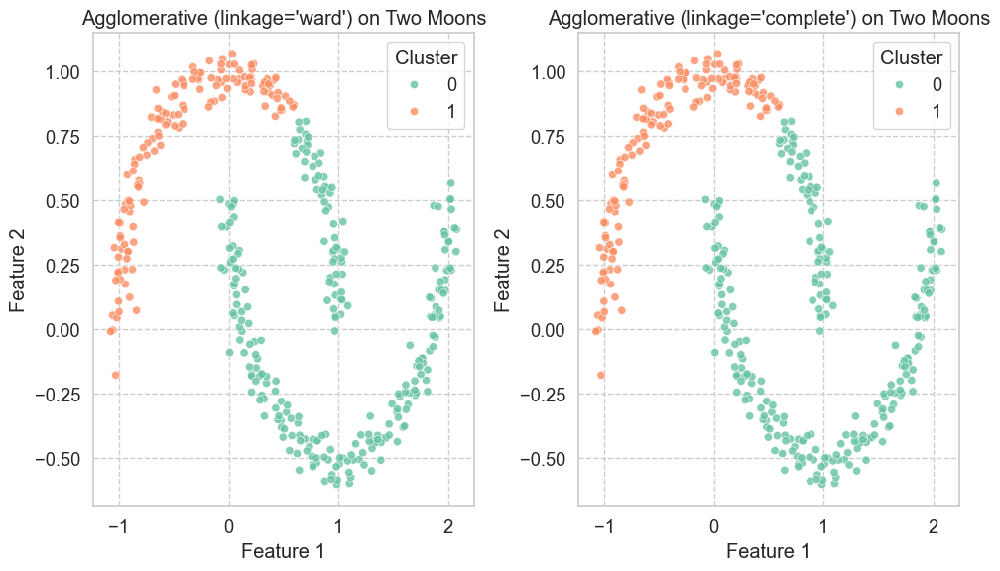

In [8]:
from sklearn.cluster import AgglomerativeClustering

# Try two common linkages on the moons
def plot_agglomerative(linkage: str, ax):
    model = AgglomerativeClustering(n_clusters=2, linkage=linkage)
    labels = model.fit_predict(X_np)
    sns.scatterplot(x=X_np[:, 0], y=X_np[:, 1], hue=labels, alpha=0.8, ax=ax)
    ax.set_title(f"Agglomerative (linkage='{linkage}') on Two Moons")
    ax.set_xlabel("Feature 1")
    ax.set_ylabel("Feature 2")
    ax.legend(title="Cluster", loc="best")

fig, axes = plt.subplots(1, 2)
plot_agglomerative("ward", axes[0])
plot_agglomerative("complete", axes[1])
plt.tight_layout()
plt.show()



## Choosing `eps` with a k-distance plot

A common heuristic is to sort, for each point, the distance to its `k`-th nearest neighbor (with `k = min_samples`) and look for the **elbow**.


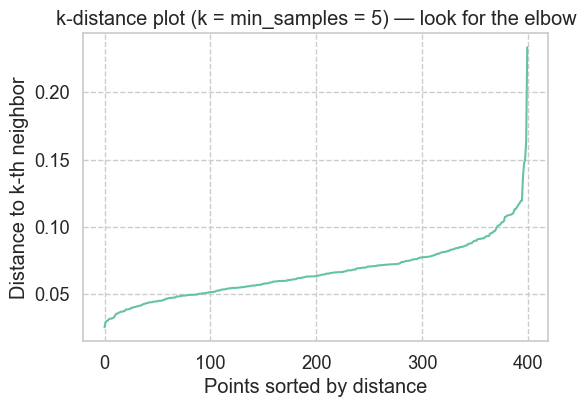

Tip: Choose eps slightly above the 'elbow' of the curve.


In [9]:

min_samples = 5  # pedagogically common default

# Fit NearestNeighbors to compute k-distances
nn = NearestNeighbors(n_neighbors=min_samples)
nn.fit(X)
dists, _ = nn.kneighbors(X)

# For each point, take the distance to the k-th neighbor (index -1 after sorting along axis=1)
k_dists = np.sort(dists[:, -1])
plt.figure(figsize=(6,4))
plt.plot(k_dists)
plt.title(f"k-distance plot (k = min_samples = {min_samples}) — look for the elbow")
plt.xlabel("Points sorted by distance")
plt.ylabel("Distance to k-th neighbor")
plt.show()

# A small printed hint for live teaching
print("Tip: Choose eps slightly above the 'elbow' of the curve.")



## Animated DBSCAN (Step-by-Step Expansion)

This cell implements a **pedagogical** version of DBSCAN so we can **record each step** and animate how clusters grow from dense regions.

- We **do not** rely on scikit-learn's internal state—this is for teaching only.
- The animation shows:
  - the current seed point and its ε-neighborhood circle,
  - unvisited points,
  - evolving cluster membership,
  - points labeled as noise.

> Note: We avoid setting explicit colors. We rely on default styling and vary markers/sizes for different roles.


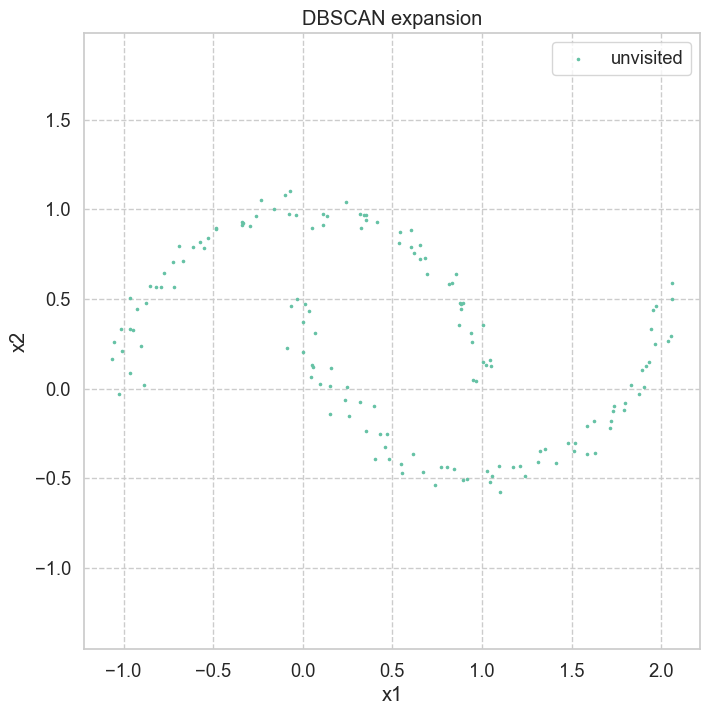

In [ ]:

from collections import deque
from matplotlib import patches
from matplotlib.animation import FuncAnimation
from IPython.display import HTML

X, _ = make_moons(n_samples=150, noise=0.05, random_state=RNG)

def region_query(X, idx, eps):
    """Return indices of points within eps of point idx (including idx)."""
    diffs = X - X[idx]
    d2 = (diffs * diffs).sum(axis=1)
    return np.where(d2 <= eps * eps)[0]

def classify_points(X, eps, min_samples):
    """Classify points as core/non-core and cache neighborhoods."""
    n = len(X)
    core_mask = np.zeros(n, dtype=bool)
    neighborhoods = []
    for i in range(n):
        neigh = region_query(X, i, eps)
        neighborhoods.append(neigh)
        if len(neigh) >= min_samples:
            core_mask[i] = True
    return core_mask, neighborhoods

def dbscan_with_states(X, eps=0.2, min_samples=5):
    """Pedagogical DBSCAN that records states for animation.
    labels: -99 unvisited, -1 noise, 0..C-1 cluster ids
    """
    n = len(X)
    labels = np.full(n, -99, dtype=int)
    core_mask, neighborhoods = classify_points(X, eps, min_samples)
    frames = []

    def snapshot(current_idx=None, show_circle=False):
        frames.append({
            "labels": labels.copy(),
            "core_mask": core_mask.copy(),
            "current_idx": current_idx,
            "show_circle": show_circle,
        })

    snapshot(None, False)
    current_cluster = -1

    for i in range(n):
        if labels[i] != -99:
            continue
        neigh = neighborhoods[i]
        if len(neigh) < min_samples:
            labels[i] = -1  # noise candidate
            snapshot(i, True)
            continue

        current_cluster += 1
        labels[i] = current_cluster
        seeds = deque([j for j in neigh if j != i])
        snapshot(i, True)

        while seeds:
            j = seeds.popleft()
            if labels[j] == -99:
                labels[j] = current_cluster
                snapshot(j, True)
                neigh_j = neighborhoods[j]
                if len(neigh_j) >= min_samples:
                    for q in neigh_j:
                        if labels[q] in (-99, -1):
                            seeds.append(q)
            elif labels[j] == -1:
                labels[j] = current_cluster
                snapshot(j, True)

    snapshot(None, False)
    return labels, frames, core_mask

# Run once to capture frames
eps = 0.2
min_samples = 5
labels_teach, frames, core_mask = dbscan_with_states(X, eps=eps, min_samples=min_samples)

def plot_frame(ax, frame, X, eps):
    ax.clear()
    ax.set_title("DBSCAN expansion")
    ax.set_xlabel("x1")
    ax.set_ylabel("x2")

    # Fix axis limits and aspect ratio to 1
    x_min, x_max = X[:, 0].min(), X[:, 0].max()
    y_min, y_max = X[:, 1].min(), X[:, 1].max()
    range_x = x_max - x_min
    range_y = y_max - y_min
    range_max = max(range_x, range_y)
    x_center = (x_max + x_min) / 2.0
    y_center = (y_max + y_min) / 2.0
    pad = 0.05 * range_max
    ax.set_xlim(x_center - range_max / 2.0 - pad, x_center + range_max / 2.0 + pad)
    ax.set_ylim(y_center - range_max / 2.0 - pad, y_center + range_max / 2.0 + pad)
    ax.set_aspect("equal", adjustable="box")

    L = frame["labels"]
    core = frame["core_mask"]
    current_idx = frame["current_idx"]
    show_circle = frame["show_circle"]

    unvisited = (L == -99)
    noise = (L == -1)

    # Unvisited
    if np.any(unvisited):
        ax.scatter(X[unvisited,0], X[unvisited,1], s=24, marker='.',
                   label="unvisited")

    # Noise
    if np.any(noise):
        ax.scatter(X[noise,0], X[noise,1], s=36, marker='x',
                   label="noise")

    # Clusters so far
    cluster_ids = sorted([c for c in np.unique(L) if c >= 0])
    cluster_markers = ['o','^','s','P','D','v','X','*','>','<']
    for idx, cid in enumerate(cluster_ids):
        mk = cluster_markers[idx % len(cluster_markers)]
        pts = (L == cid)
        ax.scatter(X[pts,0], X[pts,1], s=36, marker=mk, label=f"cluster {cid}")

    # Current point + eps circle
    if (current_idx is not None) and show_circle:
        cx, cy = X[current_idx]
        circ = patches.Circle((cx, cy), radius=eps, fill=True, linestyle='--', alpha=0.2)
        ax.add_patch(circ)
        ax.scatter([cx],[cy], s=64, marker='o', linewidths=1, label="current")

    ax.legend(loc="best")

# Build animation
fig, ax = plt.subplots(figsize=(9,9))

def _update(i):
    plot_frame(ax, frames[i], X, eps)
    return []

anim = FuncAnimation(fig, _update, frames=len(frames), interval=250, blit=False)
HTML(anim.to_jshtml())
